# Calculation of effective permittivity, permeability, and surface impedance of negative-refraction photonic crystals 
## Zhaolin Lu and Dennis W. Prather

Here we set up a 2D photonic crystal with circular atom of 2r=7a. The dielectric constant of the atom is 1, while the bulk material has dielectric constant eps=20. 

In [22]:
from photonic_crystal import CrystalSlab, Crystal2D
import numpy as np
import matplotlib.pyplot as plt
from functools import partial
from crystal_geometries import Crystal2D_Geometry, CrystalSlab_Geometry
from crystal_materials import Crystal_Materials
# Create an instance of the Crystal2D class
# Set the environmental variable before launching MPI processes
import os
os.environ["OMPI_MCA_opal_cuda_support"] = "true"

# Define the materials of the crystal
material = Crystal_Materials()
material.atom = {"epsilon": 1}
material.bulk = {"epsilon": 20}

# Define the geometry of the crystal
geometry1 = Crystal2D_Geometry(material=material, geometry_type='circular', r=0.35)
geometry = geometry1

# Define the simulation parameters
num_bands = 6
resolution = 64
interp = 10
periods = 3
lattice_type = 'triangular'
pickle_id = 'LuPr'



In [23]:

crystal_2d = Crystal2D(lattice_type=lattice_type, 
                        num_bands=num_bands, 
                        resolution=resolution, 
                        interp=interp, 
                        periods=periods, 
                        pickle_id=pickle_id,
                        geometry=geometry1,
                        material=material,
                        k_point_max=0.5,
                        use_XY=True)


# Set the solver
crystal_2d.set_solver()
crystal_2d.run_simulation(runner="run_zeven")
crystal_2d.run_simulation(runner="run_zodd")

print("Dummy simulation run")

# Extract data
crystal_2d.extract_data(periods=1)
print("Data extracted")

# Plot epsilon interactively
print("Start plotting epsilon")
fig_eps = crystal_2d.plot_epsilon()
fig_eps.update_layout(
    autosize=False,
    width=700,
    height=700
)
print("Ready to show epsilon plot")
fig_eps.show()

# Plot bands interactively
print("Start plotting bands")
fig_bands = crystal_2d.plot_bands(polarization="zodd", title='Bands', color='blue')
fig_bands = crystal_2d.plot_bands(polarization="zeven", title='Bands', color='red', fig=fig_bands)
fig_bands.update_layout(
    autosize=False,
    width=700,
    height=700
)

w_light = []
for k in crystal_2d.k_points_interpolated:
    w_light.append(np.linalg.norm(k))

import plotly.graph_objects as go
fig_bands.add_trace(
    go.Scatter(
        y= [w for w in w_light],
        mode='lines',
        marker=dict(
            size=5,
            color='black'
        ),
        name='Light line'
    )
)




print("Ready to show bands plot")
fig_bands.show()



[Vector3<0.5, 0.0, 0.0>, Vector3<0.45454545454545453, 0.0, 0.0>, Vector3<0.40909090909090906, 0.0, 0.0>, Vector3<0.36363636363636365, 0.0, 0.0>, Vector3<0.3181818181818182, 0.0, 0.0>, Vector3<0.2727272727272727, 0.0, 0.0>, Vector3<0.2272727272727273, 0.0, 0.0>, Vector3<0.18181818181818182, 0.0, 0.0>, Vector3<0.13636363636363635, 0.0, 0.0>, Vector3<0.09090909090909088, 0.0, 0.0>, Vector3<0.045454545454545414, 0.0, 0.0>, Vector3<0.0, 0.0, 0.0>, Vector3<0.0, 0.045454545454545456, 0.0>, Vector3<0.0, 0.09090909090909091, 0.0>, Vector3<0.0, 0.13636363636363635, 0.0>, Vector3<0.0, 0.18181818181818182, 0.0>, Vector3<0.0, 0.2272727272727273, 0.0>, Vector3<0.0, 0.2727272727272727, 0.0>, Vector3<0.0, 0.3181818181818182, 0.0>, Vector3<0.0, 0.36363636363636365, 0.0>, Vector3<0.0, 0.4090909090909091, 0.0>, Vector3<0.0, 0.4545454545454546, 0.0>, Vector3<0.0, 0.5, 0.0>]
[Vector3<0.5, 0.0, 0.0>, Vector3<0.45454545454545453, 0.0, 0.0>, Vector3<0.40909090909090906, 0.0, 0.0>, Vector3<0.36363636363636365,

Start plotting bands
Ready to show bands plot


Light cone intercepted slightly off compared to reference. However we can still see that there is an intersection with the second bans in the point kx = 0.227


# Analysis

We want to see if we can find the same effective parameters as Lu and Prather. Hence, we focus on the mode with kx=0.227=freq

In [ ]:
import meep as mp 
modes = crystal_2d.look_for_mode(polarization="zodd", k_point = mp.Vector3(0.227, 0, 0), freq=0.227, k_point_max_distance=0.01)
print(len(modes))
mode = modes[0]

1


## Fields representation

We plot the field so that we can compare it with the reference. Note that MPB can store the fields in two way: when we start a simulation with `run_te()` we can use the kwargs bloch_phase = false in the get_efield functions. 

In this work the effective parameters must be found. Hence, it is the periodic function in the bloch mode that must be reduced to an effective amplitude of a plane wave, which is represented by the bloch phase. That is way we are not working with the bloch phase.

In [30]:

fig_e, fig_h = crystal_2d.plot_field_components(target_polarization=mode['polarization'], 
                                        target_frequency=mode['freq'], 
                                        target_k_point=mode['k_point'], 
                                        quantity='abs',
                                        bloch_phase=False,
                                        periods=3, 
                                        colorscale='Rainbow',
                                        rectify=True,
                                        unwrap=False,
                                        phase_in_degrees=False 
                                        )
fig_e.show()

fig_e, fig_h = crystal_2d.plot_field_components(target_polarization=mode['polarization'], 
                                        target_frequency=mode['freq'], 
                                        target_k_point=mode['k_point'], 
                                        quantity='real',
                                        bloch_phase=False,
                                        periods=3, 
                                        colorscale='Rainbow',
                                        rectify=True,
                                        unwrap=False,
                                        phase_in_degrees=False 
                                        )
fig_e.show()




fig_e, fig_h = crystal_2d.plot_field_components(target_polarization=mode['polarization'], 
                                        target_frequency=mode['freq'], 
                                        target_k_point=mode['k_point'], 
                                        quantity='phase',
                                        bloch_phase=False,
                                        periods=3, 
                                        colorscale='Rainbow',
                                        rectify=True, 
                                        unwrap=True,
                                        phase_in_degrees=True
                                        )
fig_e.show()







Number of target modes found: 1


Number of target modes found: 1


Number of target modes found: 1


These plots are much similar to the ones in the reference.

## Finding the effective parameters
Now we need to calculate the effectiva parameters.  We use the formula of the paper. 

### Epsilon and Mu



Resolution:  64 Periods:  3 total points:  192
Shape of E after conversion:  (192, 192, 3)
Shape of H after conversion:  (192, 192, 3)
Shape of Ez:  (192, 192)
Shape of Hy:  (192, 192)


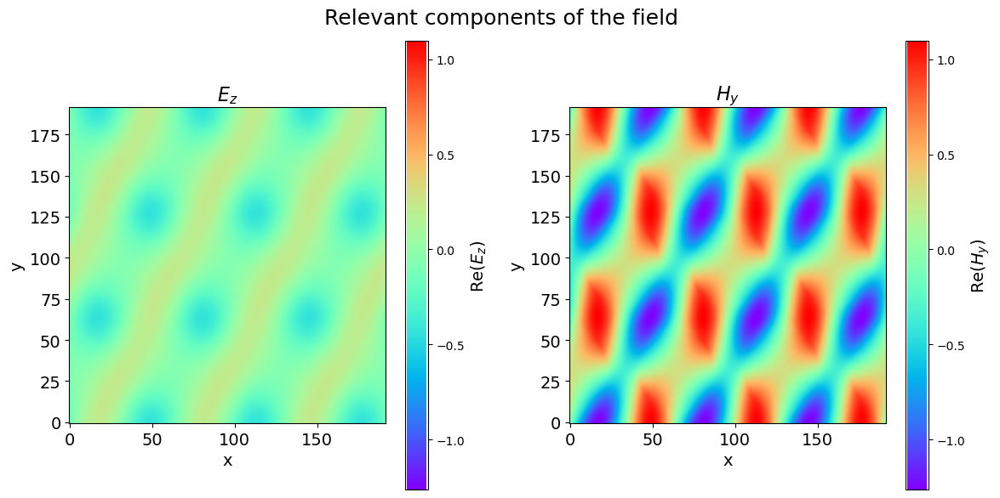

In [37]:

from photonic_crystal import suppress_output
import meep as mp
from meep import mpb
import crystal_analysis as ca

resolution  = mode["e_field_periodic"].shape[0]
periods = 3
print("Resolution: ", resolution, "Periods: ", periods, "total points: ", resolution*periods)
ms = crystal_2d.run_dumb_simulation()
md = mpb.MPBData(lattice=ms.get_lattice(), rectify = True, periods=periods)
with suppress_output():
    E= md.convert(mode["e_field_periodic"], kpoint=mp.Vector3())
    H= md.convert(mode["h_field_periodic"], kpoint=mp.Vector3())
print("Shape of E after conversion: ", E.shape)
print("Shape of H after conversion: ", H.shape)

Ez = np.array(E[...,2])
Hy = np.array(H[...,1])
print("Shape of Ez: ", Ez.shape)    
print("Shape of Hy: ", Hy.shape)
fig = ca.plot_field_components(Ez, Hy, '$E_z$', '$H_y$', title="Relevant components of the field")


 To avoid positive and negative values 
cancelling each other, like the case in sin-function, as well as to keep the “handness” of the 
electromagnetic wave, the points r are grouped into different regions

Shape of Ez_masked_I:  (192, 192)
Shape of Hy_masked_I:  (192, 192)


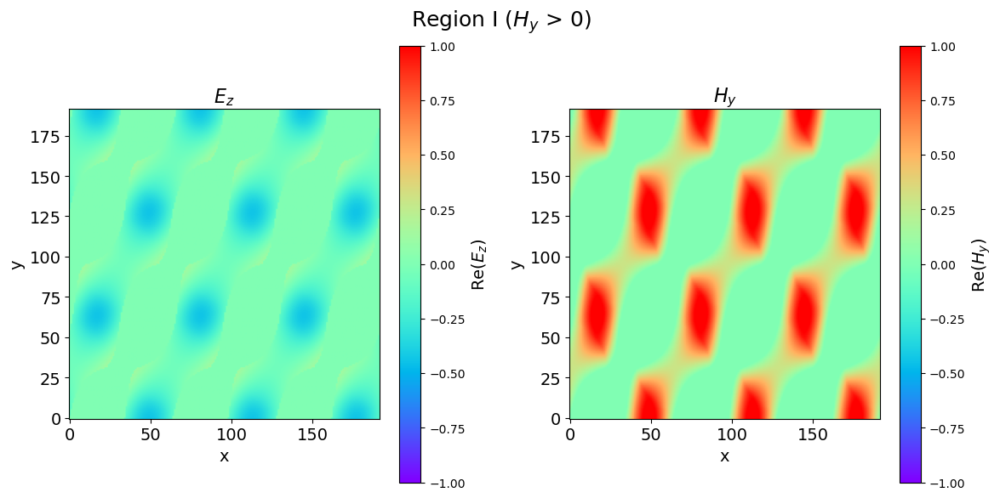

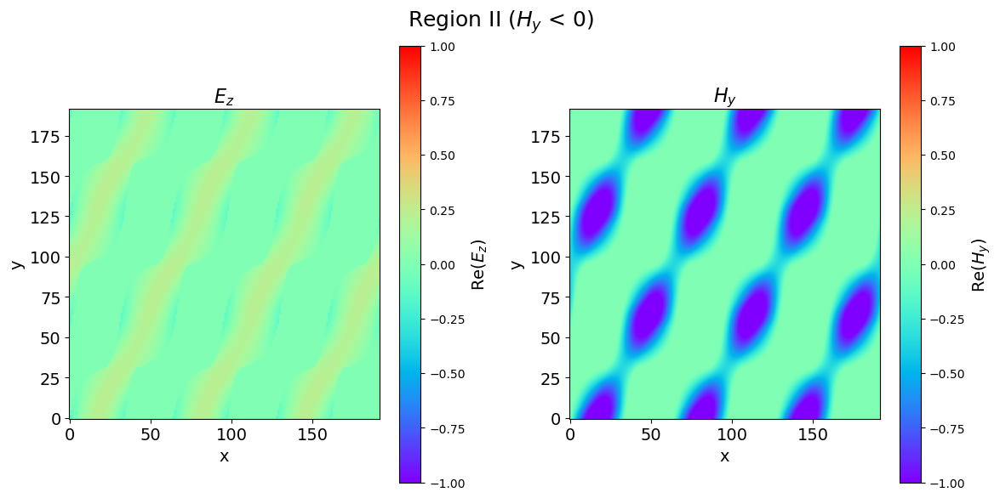

In [39]:
region_I_mask = (np.real(Hy) > 0)
region_II_mask = (np.real(Hy) < 0)

Ez_masked_I = ca.mask_field(Ez, region_I_mask)
Hy_masked_I = ca.mask_field(Hy, region_I_mask)
ca.plot_field_components(Ez_masked_I, Hy_masked_I, '$E_z$', '$H_y$', vmin=-1, vmax=1, title="Region I ($H_y$ > 0)")

Ez_masked_II = ca.mask_field(Ez, region_II_mask)
Hy_masked_II = ca.mask_field(Hy, region_II_mask)
ca.plot_field_components(Ez_masked_II, Hy_masked_II, '$E_z$', '$H_y$', vmin=-1, vmax=1, title="Region II ($H_y$ < 0)")

print("Shape of Ez_masked_I: ", Ez_masked_I.shape)
print("Shape of Hy_masked_I: ", Hy_masked_I.shape)

Now we average

In [41]:
# Now we calculate the average fields in each region integrating.
Ez_avg_I = ca.integrate_field(Ez_masked_I, resolution, periods)
Hy_avg_I = ca.integrate_field(Hy_masked_I, resolution, periods)

Ez_avg_II = ca.integrate_field(Ez_masked_II, resolution, periods)
Hy_avg_II = ca.integrate_field(Hy_masked_II, resolution, periods)



print("Ez_avg_I: ", Ez_avg_I)
print("Hy_avg_I: ", Hy_avg_I)
print("Ez_avg_II: ", Ez_avg_II)
print("Hy_avg_II: ", Hy_avg_II)


dx:  0.015625 dy:  0.015625
dx:  0.015625 dy:  0.015625
dx:  0.015625 dy:  0.015625
dx:  0.015625 dy:  0.015625
Ez_avg_I:  (-0.0746264108289499-0.0009357559395785736j)
Hy_avg_I:  (0.24487720043072345+0.0019222280890685353j)
Ez_avg_II:  (0.05874382754776428-0.00048458943805631166j)
Hy_avg_II:  (-0.26052574415714747-0.003321643810997942j)


We use previous resuts to finally get the eps_eff and mu_eff. We neglect the imag parts because they are  at least 1 order of magintude smaller than the real parts

In [42]:
# Now we calculate the effective parameters, one value for each region
epsilon_eff_I, mu_eff_I = ca.calculate_effective_parameters(Ez_avg_I, Hy_avg_I, mode["freq"], mode["k_point"][0])
epsilon_eff_II, mu_eff_II = ca.calculate_effective_parameters(Ez_avg_II, Hy_avg_II, mode["freq"], mode["k_point"][0])

print("\nEffective parameters in region I:")
print(" epsilon_eff: ", epsilon_eff_I)
print(" mu_eff: ", mu_eff_I)


print("\nEffective parameters in region II:")
print("epsilon_eff: ", epsilon_eff_II)
print("mu_eff: ", mu_eff_II)



# Now we calculate the effective parameters for the whole domain
epsilon_eff = np.sqrt(epsilon_eff_I +0j)*np.sqrt(epsilon_eff_II+0j)
mu_eff = np.sqrt(mu_eff_I +0j)*np.sqrt(mu_eff_II+0j)

print("\nEffective parameters for the whole domain:")
print(" epsilon_eff: ", epsilon_eff)
print(" mu_eff: ", mu_eff)


Effective parameters in region I:
 epsilon_eff:  -3.2330503591895567
 mu_eff:  -0.30026234748520225

Effective parameters in region II:
epsilon_eff:  -4.369634153866357
mu_eff:  -0.22216122819554085

Effective parameters for the whole domain:
 epsilon_eff:  (-3.7586230551472672+0j)
 mu_eff:  (-0.25827630920815947+0j)


### Effective surface impedance


Here we use an 1D integral

In [59]:
dx = 1/resolution
dy = 1/resolution

Ly = 1 * periods
Lx = 1 * periods

x0 = 0

Ez_masked_I = ca.mask_field(Ez, region_I_mask)
Ez_1d_avg_I = np.sum(Ez_masked_I[0,:])*dy/Ly
print("Ez_1d_avg_I: ", Ez_1d_avg_I)

Hy_masked_I = ca.mask_field(Hy, region_I_mask)
Hy_1d_avg_I = np.sum(Hy_masked_I[0,:])*dy/Ly
print("Hy_1d_avg_I: ", Hy_1d_avg_I)


Ez_masked_II = ca.mask_field(Ez, region_II_mask)
Ez_1d_avg_II = np.sum(Ez_masked_II[0,:])*dy/Ly
print("Ez_1d_avg_II: ", Ez_1d_avg_II)


Hy_masked_II = ca.mask_field(Hy, region_II_mask)
Hy_1d_avg_II = np.sum(Hy_masked_II[0,:])*dy/Ly
print("Hy_1d_avg_II: ", Hy_1d_avg_II)

eta_eff_I = -Ez_1d_avg_I/Hy_1d_avg_I
print("eta_ef_I: ", eta_eff_I)

eta_eff_II = -Ez_1d_avg_II/Hy_1d_avg_II
print("eta_eff_II: ", eta_eff_II)

eta_eff = np.sqrt(eta_eff_I)*np.sqrt(eta_eff_II)
print("eta_eff: ", eta_eff)


Ez_1d_avg_I:  (-0.048795319863376554+0.01673065808133172j)
Hy_1d_avg_I:  (0.11071574343446786-0.07108570050727173j)
Ez_1d_avg_II:  (0.014810303225339046-0.01797780233878112j)
Hy_1d_avg_II:  (-0.11174049860066611+0.06545154479671865j)
eta_ef_I:  (0.38077884203289025+0.09336768486807508j)
eta_eff_II:  (0.16884985007664124-0.061985751802697935j)
eta_eff:  (0.26514217462225104-0.014780264990204517j)


This result is similar to the original of 0.283